In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
from shapely.geometry import Polygon
import osmnx as ox
import json
import geopy.distance

import contextily as ctx
from pyproj import Proj, transform
from matplotlib.colors import LogNorm
import matplotlib.colors as mcolors

上海市路网可视化

In [40]:
path='./shanghai_roadmap.json'
#path='./shenzhen.json'
f = open(path, 'r')
content = f.read()
js_sh = json.loads(content)


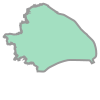

In [41]:
edge_sh=js_sh['features'][0]['geometry']['coordinates'][0][0]
polygon_sh = Polygon(edge_sh)
polygon_sh

In [42]:
gdf_sh=gpd.GeoDataFrame([1],geometry=[polygon_sh])
gdf_sh.set_crs(epsg=4326, inplace=True)
gdf_sh

,0,geometry
0,1,"POLYGON ((121.15374 31.27665, 121.15039 31.275..."


In [43]:
custom_filter = '["highway"~"motorway|motorway_link|trunk|trunk_link|primary|primary_link|secondary|secondary_link|tertiary"]'
G = ox.graph_from_polygon(gdf_sh.iloc[0]['geometry'], network_type='drive',custom_filter=custom_filter)
nodes, edges = ox.graph_to_gdfs(G)
nodes=nodes.reset_index()
edges=edges.reset_index()
edges=edges.rename(columns={"u":"start","v":"end","osmid":"road_id","highway":"fclass"})#fclass为路段等级
edges=edges[['start','end','fclass','maxspeed','road_id','geometry']]
edges=edges.reset_index()
edges=edges.drop(columns=['road_id'])
edges=edges.rename(columns={"index":"road_id"})
nodes

,osmid,y,x,street_count,ref,highway,geometry
0,86829630,30.910971,121.602636,3,NaN,NaN,POINT (121.60264 30.91097)
1,86829657,30.913186,121.527952,3,90,motorway_junction,POINT (121.52795 30.91319)
2,86829675,30.908778,121.486165,3,94,motorway_junction,POINT (121.48616 30.90878)
3,86841160,30.908507,121.482588,3,NaN,NaN,POINT (121.48259 30.90851)
4,86841175,30.910665,121.479289,3,NaN,NaN,POINT (121.47929 30.91067)
...,...,...,...,...,...,...,...
21819,11836640219,31.217249,121.159829,4,NaN,NaN,POINT (121.15983 31.21725)
21820,11836640236,31.217246,121.159950,4,NaN,NaN,POINT (121.15995 31.21725)
21821,11836640237,31.217132,121.159955,3,NaN,NaN,POINT (121.15995 31.21713)
21822,11896814175,31.133126,121.121410,3,NaN,NaN,POINT (121.12141 31.13313)


In [44]:
"""下载的路网数据有一些问题，一些值是一个列表[]，所以把这部分清洗一下"""
def take_first_if_list(x):
    if isinstance(x, list):
        return x[0]
    return x

In [45]:
# 应用这个函数到指定列
edges['fclass'] = edges['fclass'].apply(take_first_if_list)
edges['maxspeed'] = edges['maxspeed'].apply(take_first_if_list)
edges['maxspeed'] = pd.to_numeric(edges['maxspeed'], errors='coerce')
nodes=nodes.rename(columns={"y":"POINT_Y","x":"POINT_X","osmid":"id"})
nodes=nodes.drop(columns=['ref','highway'])

edge_shp=edges.copy()
node_shp=nodes.copy()
edge_shp= edge_shp.to_crs(epsg=32633)
edge_shp['length'] = edge_shp.geometry.length
edge_shp=edge_shp.to_crs(epsg=4326)

In [46]:
# 道路的类型展示
edges['fclass'].unique()

array(['motorway', 'motorway_link', 'tertiary', 'secondary', 'primary',
       'primary_link', 'trunk', 'trunk_link', 'secondary_link',
       'tertiary_link'], dtype=object)

In [47]:
nodes

,id,POINT_Y,POINT_X,street_count,geometry
0,86829630,30.910971,121.602636,3,POINT (121.60264 30.91097)
1,86829657,30.913186,121.527952,3,POINT (121.52795 30.91319)
2,86829675,30.908778,121.486165,3,POINT (121.48616 30.90878)
3,86841160,30.908507,121.482588,3,POINT (121.48259 30.90851)
4,86841175,30.910665,121.479289,3,POINT (121.47929 30.91067)
...,...,...,...,...,...
21819,11836640219,31.217249,121.159829,4,POINT (121.15983 31.21725)
21820,11836640236,31.217246,121.159950,4,POINT (121.15995 31.21725)
21821,11836640237,31.217132,121.159955,3,POINT (121.15995 31.21713)
21822,11896814175,31.133126,121.121410,3,POINT (121.12141 31.13313)


In [48]:
#计算道路的交叉点关系
inter_num=node_shp[['id','street_count']].copy()
inter_num.columns=['start','start_num']
edge_shp=pd.merge(edge_shp,inter_num,on=['start'])
inter_num.columns=['end','end_num']
edge_shp=pd.merge(edge_shp,inter_num,on=['end'])
edge_shp

,road_id,start,end,fclass,maxspeed,geometry,length,start_num,end_num
0,0,86829630,3372606283,motorway,NaN,"LINESTRING (121.60264 30.91097, 121.60202 30.9...",6596.846593,3,3
1,1,86829657,3299585023,motorway,NaN,"LINESTRING (121.52795 30.91319, 121.52028 30.9...",2563.479544,3,3
2,814,1106518588,3299585023,motorway_link,NaN,"LINESTRING (121.51616 30.91238, 121.51531 30.9...",581.779077,3,3
3,2,86829657,91429846,motorway_link,NaN,"LINESTRING (121.52795 30.91319, 121.52660 30.9...",413.403031,3,3
4,3,86829675,86841160,motorway_link,NaN,"LINESTRING (121.48616 30.90878, 121.48471 30.9...",603.116542,3,3
...,...,...,...,...,...,...,...,...,...
46916,46911,11836640218,11836640237,tertiary,NaN,"LINESTRING (121.15984 31.21714, 121.15995 31.2...",19.117037,3,3
46917,46913,11836640219,4718254101,tertiary,NaN,"LINESTRING (121.15983 31.21725, 121.15887 31.2...",1715.856773,4,1
46918,46914,11836640236,11836640219,tertiary,NaN,"LINESTRING (121.15995 31.21725, 121.15983 31.2...",20.110904,4,4
46919,46915,11836640236,11836640219,tertiary,NaN,"LINESTRING (121.15995 31.21725, 121.15994 31.2...",7148.330931,4,4


In [49]:
# 为所有的道路填充maxspeed
edge_shp['maxspeed']=edge_shp['maxspeed'].fillna(0)
road_types = ['secondary', 'secondary_link', 'motorway', 'motorway_link',
       'trunk_link', 'trunk', 'primary_link', 'tertiary', 'primary','tertiary_link'] 
max_speeds = [46.76,34.17,93.43,37.41,58.65,63.59,30.89,20,54.74,20]  
speed_map = dict(zip(road_types, max_speeds))
edge_shp.loc[edge_shp['maxspeed'] == 0, 'maxspeed'] = edge_shp['fclass'].map(speed_map)
edge_shp

,road_id,start,end,fclass,maxspeed,geometry,length,start_num,end_num
0,0,86829630,3372606283,motorway,93.43,"LINESTRING (121.60264 30.91097, 121.60202 30.9...",6596.846593,3,3
1,1,86829657,3299585023,motorway,93.43,"LINESTRING (121.52795 30.91319, 121.52028 30.9...",2563.479544,3,3
2,814,1106518588,3299585023,motorway_link,37.41,"LINESTRING (121.51616 30.91238, 121.51531 30.9...",581.779077,3,3
3,2,86829657,91429846,motorway_link,37.41,"LINESTRING (121.52795 30.91319, 121.52660 30.9...",413.403031,3,3
4,3,86829675,86841160,motorway_link,37.41,"LINESTRING (121.48616 30.90878, 121.48471 30.9...",603.116542,3,3
...,...,...,...,...,...,...,...,...,...
46916,46911,11836640218,11836640237,tertiary,20.00,"LINESTRING (121.15984 31.21714, 121.15995 31.2...",19.117037,3,3
46917,46913,11836640219,4718254101,tertiary,20.00,"LINESTRING (121.15983 31.21725, 121.15887 31.2...",1715.856773,4,1
46918,46914,11836640236,11836640219,tertiary,20.00,"LINESTRING (121.15995 31.21725, 121.15983 31.2...",20.110904,4,4
46919,46915,11836640236,11836640219,tertiary,20.00,"LINESTRING (121.15995 31.21725, 121.15994 31.2...",7148.330931,4,4


In [50]:
"""为所有的道路填充最高速度和容量的参数"""
edge_shp['capacity']=0
edge_shp.loc[edge_shp['fclass']=='motorway','capacity']=edge_shp['maxspeed']*1000*3/100
edge_shp.loc[edge_shp['fclass']!='motorway','capacity']=edge_shp['maxspeed']/2*1000*3/50
edge_shp.loc[edge_shp['fclass']=='tertiary','capacity']=edge_shp['maxspeed']/2*1000*2/50
edge_shp.loc[edge_shp['fclass']=='tertiary_link','capacity']=edge_shp['maxspeed']/2*1000*2/50
edge_shp.loc[(edge_shp['fclass']=='trunk')&(edge_shp['end_num']>3),'capacity']=edge_shp['capacity']*0.7
edge_shp.loc[(edge_shp['fclass']=='primary')&(edge_shp['end_num']>3),'capacity']=edge_shp['capacity']*0.6
edge_shp.loc[(edge_shp['fclass']=='secondary')&(edge_shp['end_num']>3),'capacity']=edge_shp['capacity']*0.5
edge_shp.loc[(edge_shp['fclass']=='tertiary')&(edge_shp['end_num']>3),'capacity']=edge_shp['capacity']*0.4
edge_shp

,road_id,start,end,fclass,maxspeed,geometry,length,start_num,end_num,capacity
0,0,86829630,3372606283,motorway,93.43,"LINESTRING (121.60264 30.91097, 121.60202 30.9...",6596.846593,3,3,2802.9
1,1,86829657,3299585023,motorway,93.43,"LINESTRING (121.52795 30.91319, 121.52028 30.9...",2563.479544,3,3,2802.9
2,814,1106518588,3299585023,motorway_link,37.41,"LINESTRING (121.51616 30.91238, 121.51531 30.9...",581.779077,3,3,1122.3
3,2,86829657,91429846,motorway_link,37.41,"LINESTRING (121.52795 30.91319, 121.52660 30.9...",413.403031,3,3,1122.3
4,3,86829675,86841160,motorway_link,37.41,"LINESTRING (121.48616 30.90878, 121.48471 30.9...",603.116542,3,3,1122.3
...,...,...,...,...,...,...,...,...,...,...
46916,46911,11836640218,11836640237,tertiary,20.00,"LINESTRING (121.15984 31.21714, 121.15995 31.2...",19.117037,3,3,400.0
46917,46913,11836640219,4718254101,tertiary,20.00,"LINESTRING (121.15983 31.21725, 121.15887 31.2...",1715.856773,4,1,400.0
46918,46914,11836640236,11836640219,tertiary,20.00,"LINESTRING (121.15995 31.21725, 121.15983 31.2...",20.110904,4,4,160.0
46919,46915,11836640236,11836640219,tertiary,20.00,"LINESTRING (121.15995 31.21725, 121.15994 31.2...",7148.330931,4,4,160.0


In [51]:
""""道路的自由走行时间=不同路段的长度，以最高速度行驶,t_i0=d_i/v_imax"""
edge_shp['free_t_0']=edge_shp['length']*3.6/edge_shp['maxspeed']   #m/s
node_shp=node_shp[node_shp['id'].isin(pd.concat([edge_shp['start'],edge_shp['end']]).unique())]
node_shp

,id,POINT_Y,POINT_X,street_count,geometry
0,86829630,30.910971,121.602636,3,POINT (121.60264 30.91097)
1,86829657,30.913186,121.527952,3,POINT (121.52795 30.91319)
2,86829675,30.908778,121.486165,3,POINT (121.48616 30.90878)
3,86841160,30.908507,121.482588,3,POINT (121.48259 30.90851)
4,86841175,30.910665,121.479289,3,POINT (121.47929 30.91067)
...,...,...,...,...,...
21819,11836640219,31.217249,121.159829,4,POINT (121.15983 31.21725)
21820,11836640236,31.217246,121.159950,4,POINT (121.15995 31.21725)
21821,11836640237,31.217132,121.159955,3,POINT (121.15995 31.21713)
21822,11896814175,31.133126,121.121410,3,POINT (121.12141 31.13313)


In [52]:
""""给每一段道路添加起点-终点的节点编号"""
node_shp=node_shp.reset_index()
node_shp=node_shp.rename(columns={"index":"new_id"})
temp=node_shp[['new_id','id']]
temp.columns=['newstart','start']
edge_shp=pd.merge(edge_shp,temp,on=['start'])
temp.columns=['newend','end']
edge_shp=pd.merge(edge_shp,temp,on=['end'])
edge_shp

,road_id,start,end,fclass,maxspeed,geometry,length,start_num,end_num,capacity,free_t_0,newstart,newend
0,0,86829630,3372606283,motorway,93.43,"LINESTRING (121.60264 30.91097, 121.60202 30.9...",6596.846593,3,3,2802.9,254.186533,0,1587
1,1,86829657,3299585023,motorway,93.43,"LINESTRING (121.52795 30.91319, 121.52028 30.9...",2563.479544,3,3,2802.9,98.774766,1,1564
2,814,1106518588,3299585023,motorway_link,37.41,"LINESTRING (121.51616 30.91238, 121.51531 30.9...",581.779077,3,3,1122.3,55.985156,366,1564
3,2,86829657,91429846,motorway_link,37.41,"LINESTRING (121.52795 30.91319, 121.52660 30.9...",413.403031,3,3,1122.3,39.782168,1,12
4,3,86829675,86841160,motorway_link,37.41,"LINESTRING (121.48616 30.90878, 121.48471 30.9...",603.116542,3,3,1122.3,58.038480,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46916,46904,11802550533,1187044496,tertiary,20.00,"LINESTRING (121.21733 31.27685, 121.21750 31.2...",892.614423,3,3,400.0,160.670596,21814,20670
46917,46905,11802550533,1751008879,trunk,80.00,"LINESTRING (121.21733 31.27685, 121.21762 31.2...",888.532248,3,3,2400.0,39.983951,21814,20955
46918,46911,11836640218,11836640237,tertiary,20.00,"LINESTRING (121.15984 31.21714, 121.15995 31.2...",19.117037,3,3,400.0,3.441067,21818,21821
46919,46914,11836640236,11836640219,tertiary,20.00,"LINESTRING (121.15995 31.21725, 121.15983 31.2...",20.110904,4,4,160.0,3.619963,21820,21819


In [53]:
edge_shp=edge_shp.drop(columns=['start','end'])
edge_shp=edge_shp.rename(columns={"newstart":"start","newend":"end"})
node_shp=node_shp.drop(columns=['id'])
node_shp=node_shp.rename(columns={"new_id":"id"})
edge_shp

,road_id,fclass,maxspeed,geometry,length,start_num,end_num,capacity,free_t_0,start,end
0,0,motorway,93.43,"LINESTRING (121.60264 30.91097, 121.60202 30.9...",6596.846593,3,3,2802.9,254.186533,0,1587
1,1,motorway,93.43,"LINESTRING (121.52795 30.91319, 121.52028 30.9...",2563.479544,3,3,2802.9,98.774766,1,1564
2,814,motorway_link,37.41,"LINESTRING (121.51616 30.91238, 121.51531 30.9...",581.779077,3,3,1122.3,55.985156,366,1564
3,2,motorway_link,37.41,"LINESTRING (121.52795 30.91319, 121.52660 30.9...",413.403031,3,3,1122.3,39.782168,1,12
4,3,motorway_link,37.41,"LINESTRING (121.48616 30.90878, 121.48471 30.9...",603.116542,3,3,1122.3,58.038480,2,3
...,...,...,...,...,...,...,...,...,...,...,...
46916,46904,tertiary,20.00,"LINESTRING (121.21733 31.27685, 121.21750 31.2...",892.614423,3,3,400.0,160.670596,21814,20670
46917,46905,trunk,80.00,"LINESTRING (121.21733 31.27685, 121.21762 31.2...",888.532248,3,3,2400.0,39.983951,21814,20955
46918,46911,tertiary,20.00,"LINESTRING (121.15984 31.21714, 121.15995 31.2...",19.117037,3,3,400.0,3.441067,21818,21821
46919,46914,tertiary,20.00,"LINESTRING (121.15995 31.21725, 121.15983 31.2...",20.110904,4,4,160.0,3.619963,21820,21819


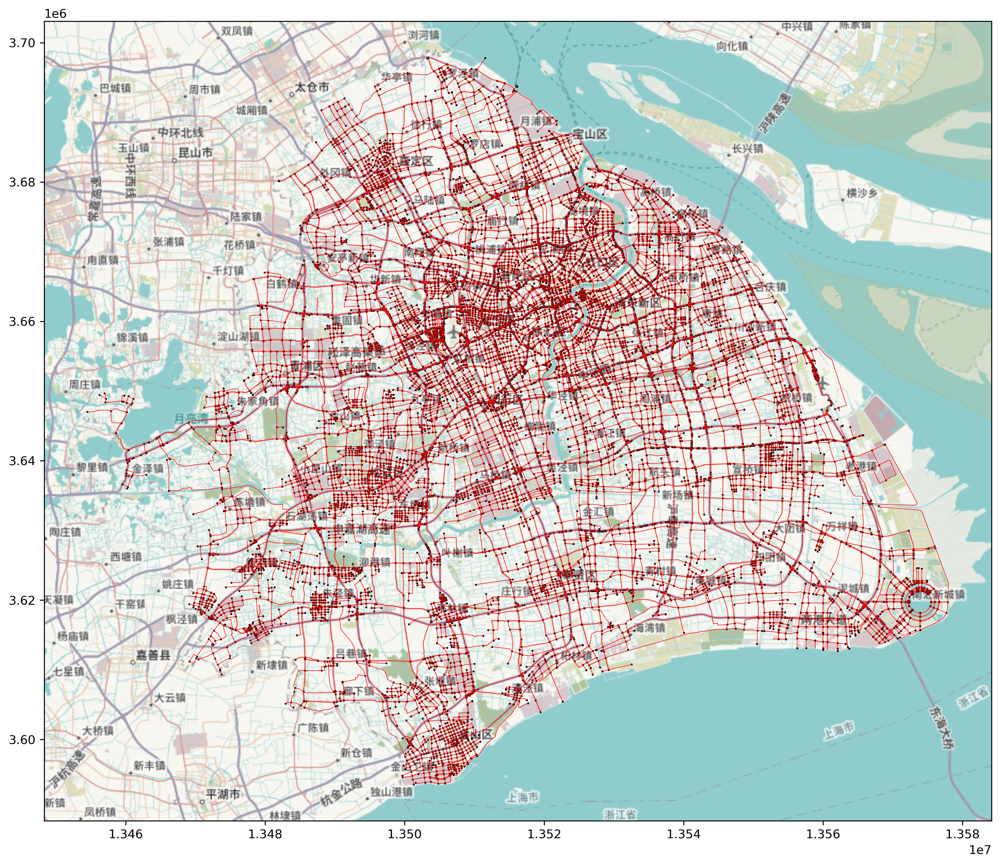

In [54]:
#绘制路网图
fig,ax=plt.subplots(figsize=(14,14),dpi=300)
edge_shp=edge_shp.to_crs(epsg=3857)
node_shp=node_shp.to_crs(epsg=3857)
ax=node_shp.plot(ax=ax,color='black',markersize=0.4)
ax=edge_shp.plot(ax=ax,color='red',linewidth=0.35)
ctx.add_basemap(ax, source='https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png')
#plt.savefig("./new_cut_road(osmnx).pdf",dpi=1200,bbox_inches='tight')
#plt.savefig("./final_result/new_cut_road(osmnx).png",dpi=1200,bbox_inches='tight')
edge_shp=edge_shp.to_crs(epsg=4326)
node_shp=node_shp.to_crs(epsg=4326)

上海市需求数据

In [55]:
def haversine_distance(lat1, lon1, lat2, lon2):
    return geopy.distance.geodesic((lat1, lon1), (lat2, lon2)).meters

In [64]:
od_path='.././Data/shanghai_withcity.csv'
od_source=pd.read_csv(od_path)

od_source['distance']=od_source.apply(lambda row:haversine_distance(row['slat'],row['slng'],row['elat'],row['elng']),axis=1)
od_source.to_csv('./shanghai_od.csv',index=False)
od_source

,hour,sZoneID,eZoneID,demand,sname,slng,slat,ename,elng,elat,distance
0,20,wtw3mz,wtw3ym,1,上海市,121.547241,31.198425,上海市,121.569214,31.275330,8779.840661
1,17,wtw3mz,wtw3ym,1,上海市,121.547241,31.198425,上海市,121.569214,31.275330,8779.840661
2,16,wtw3mz,wtw3ym,1,上海市,121.547241,31.198425,上海市,121.569214,31.275330,8779.840661
3,12,wtw3mz,wtw3ym,1,上海市,121.547241,31.198425,上海市,121.569214,31.275330,8779.840661
4,15,wtw3mz,wtw3ym,1,上海市,121.547241,31.198425,上海市,121.569214,31.275330,8779.840661
...,...,...,...,...,...,...,...,...,...,...,...
48801297,15,wtwm1h,wtwm0z,1,上海市,121.338501,31.841125,上海市,121.327515,31.857605,2102.455370
48801298,7,wtwdvv,wtwdyq,1,上海市,121.898804,31.451111,上海市,121.920776,31.456604,2175.477536
48801299,15,wtwe1n,wtwe1s,1,上海市,121.690063,31.500549,上海市,121.712036,31.489563,2416.979621
48801300,9,wtqr56,wtqr53,1,上海市,121.437378,30.775452,上海市,121.437378,30.769958,609.002744


In [66]:
od_source.to_csv('./shanghai_od.csv',index=False)

In [62]:

demand_path='.././Data/demand_shanghai.csv'
demand_sh=pd.read_csv(demand_path)
demand_sh

,sZoneID,eZoneID,sjiedao,ejiedao,slng,slat,elng,elat,demand,sarea,earea
0,182,182,浦江镇,浦江镇,121.514959,31.062084,121.514959,31.062084,6.289585e+05,6.242574e+07,6.242574e+07
1,13,13,安亭镇,安亭镇,121.199138,31.299911,121.199138,31.299911,4.248407e+05,5.393007e+07,5.393007e+07
2,0,0,祝桥镇,祝桥镇,121.794527,31.125330,121.794527,31.125330,4.218301e+05,9.408652e+07,9.408652e+07
3,139,139,三林镇,三林镇,121.498962,31.144384,121.498962,31.144384,4.178196e+05,2.379527e+07,2.379527e+07
4,23,23,南桥镇,南桥镇,121.455208,30.940517,121.455208,30.940517,3.931912e+05,4.501415e+07,4.501415e+07
...,...,...,...,...,...,...,...,...,...,...,...
53221,239,67,淀山湖镇,湖南路街道,121.061586,31.172091,121.442924,31.214611,4.899560e-07,2.354126e+05,1.047937e+06
53222,239,205,淀山湖镇,静安寺街道,121.061586,31.172091,121.438830,31.223094,3.437933e-07,2.354126e+05,9.565654e+05
53223,241,239,花桥镇,淀山湖镇,121.124323,31.316263,121.061586,31.172091,3.402063e-07,4.765148e+05,2.354126e+05
53224,250,77,独山港镇,曹杨新村街道,121.264788,30.714202,121.403328,31.241241,2.780429e-07,8.613015e+04,1.271659e+06


In [68]:
"""认为出行距离大于2.5km的，才会使用驾车的道路或者飞行汽车"""
od_filter=od_source[od_source['distance']>5000]

"""后面的交通分配以15分钟作为基础，因此2小时/8；同时，筛选出十五分钟通勤量大于10的OD对，简化数据"""
od_filter['demand']=od_filter['demand']/8
od_filter=od_filter[od_filter['demand']>10]
od_filter

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_32932\818387467.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  od_filter['demand']=od_filter['demand']/8


,hour,sZoneID,eZoneID,demand,sname,slng,slat,ename,elng,elat,distance
1437083,14,wtw3t1,wtw3ef,10.125,上海市,121.514282,31.209412,上海市,121.459351,31.214905,5269.867283
1437129,9,wtw3t1,wtw3ef,14.250,上海市,121.514282,31.209412,上海市,121.459351,31.214905,5269.867283
2338909,14,wtw98v,wtw3sy,10.500,上海市,121.679077,31.231384,上海市,121.503296,31.236877,16757.771394
2338958,9,wtw98v,wtw3sy,10.375,上海市,121.679077,31.231384,上海市,121.503296,31.236877,16757.771394
2665801,10,wtw3tx,wtw3d4,10.875,上海市,121.536255,31.242371,上海市,121.382446,31.214905,14967.274360
3959352,10,wtw3v3,wtw36k,13.375,上海市,121.525269,31.253357,上海市,121.393433,31.181946,14849.143288
4362806,11,wtw3ef,wtw3t1,10.750,上海市,121.459351,31.214905,上海市,121.514282,31.209412,5269.867283
4362831,10,wtw3ef,wtw3t1,17.125,上海市,121.459351,31.214905,上海市,121.514282,31.209412,5269.867283
4362832,9,wtw3ef,wtw3t1,13.875,上海市,121.459351,31.214905,上海市,121.514282,31.209412,5269.867283
5484701,9,wtw3d4,wtw3tx,10.375,上海市,121.382446,31.214905,上海市,121.536255,31.242371,14967.274360


In [59]:
"""本小节是用来填补没有最高行驶速度道路信息的，不用每次都执行，用于估计各种类型道路的最高速度，保留即可！！！！！！"""
print("motorway average max speed: ",edge_shp[(edge_shp['fclass']=='motorway')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("motorway_link average max speed: ",edge_shp[(edge_shp['fclass']=='motorway_link')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("trunk average max speed: ",edge_shp[(edge_shp['fclass']=='trunk')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("trunk_link average max speed: ",edge_shp[(edge_shp['fclass']=='trunk_link')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("primary average max speed: ",edge_shp[(edge_shp['fclass']=='primary')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("primary_link average max speed: ",edge_shp[(edge_shp['fclass']=='primary_link')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("secondary average max speed: ",edge_shp[(edge_shp['fclass']=='secondary')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("secondary average max speed: ",edge_shp[(edge_shp['fclass']=='secondary_link')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())
print("teritary average max speed: ",edge_shp[(edge_shp['fclass']=='teritary')&(edge_shp['maxspeed']>0)]['maxspeed'].mean())

motorway average max speed:  92.46045871559477
motorway_link average max speed:  37.81042563845956
trunk average max speed:  64.7003639618118
trunk_link average max speed:  58.2470837253067
primary average max speed:  54.76395911145429
primary_link average max speed:  31.10458208955194
secondary average max speed:  46.92304389132273
secondary average max speed:  34.13693069306937
teritary average max speed:  nan
